# Climatologies de l'atmosphère à partir de réanalyses météorologiques

Auteur : FERRY Frédéric (DESR/ENM/C3M) - septembre 2021

Les fichiers de données au format netcdf (moyennes mensuelles NCEP/NCAR) doivent être téléchargés et placés dans le répertoire data :

Géopotentiel, température, vent zonal, vent méridien, Pmer :
- ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis.derived/pressure/hgt.mon.mean.nc
- ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis.derived/pressure/air.mon.mean.nc
- ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.mean.nc
- ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.mean.nc
- ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis.derived/surface/slp.mon.mean.nc

Base de données de cyclones tropicaux :
- ftp://eclipse.ncdc.noaa.gov/pub/ibtracs/v03r04/all/netcdf/

Outgoing Longwave Radiation (OLR) :
- ftp://ftp.cdc.noaa.gov/Datasets/interp_OLR/olr.mon.mean.nc

Concepts Python illustrés :
- Calcul de climatologies saisonnières à partir de données météorologiques au format netcdf (xarray)
- Tracé de cartes globales sur surface horizontale ou isobare (cartopy)
- Tracé de coupes et profils (matplotlib)

In [47]:
%matplotlib inline

import os

import xarray as xr
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib.path as mpath

from cartopy.util import add_cyclic_point
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import IPython.display as IPdisplay, matplotlib.font_manager as fm
from PIL import Image
import glob

from scipy.integrate import cumtrapz

import warnings
warnings.filterwarnings('ignore')

# Traitement des données

In [48]:
re=6.37e6
g=9.81
cp=1004.5
r=2*cp/7
kap=r/cp
omega=7.292e-5
pi=3.14159265

In [49]:
year1='1990'
year2='2019'

In [50]:
diri="./data/"

# z, T, u, v, p
fz    = xr.open_dataset(diri+"hgt.mon.mean.nc").sel(time=slice(year1,year2))
ft    = xr.open_dataset(diri+"air.mon.mean.nc").sel(time=slice(year1,year2))+273.15
fu    = xr.open_dataset(diri+"uwnd.mon.mean.nc").sel(time=slice(year1,year2))
fv    = xr.open_dataset(diri+"vwnd.mon.mean.nc").sel(time=slice(year1,year2))
fp    = xr.open_dataset(diri+"slp.mon.mean.nc").sel(time=slice(year1,year2))

# Latitudes, niveaux verticaux
lat  = ft.lat.values
lev = fz.level.values

print(ft)
print(lev)

<xarray.Dataset>
Dimensions:  (level: 17, lat: 73, lon: 144, time: 360)
Coordinates:
  * level    (level) float32 1e+03 925.0 850.0 700.0 ... 50.0 30.0 20.0 10.0
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 1990-01-01 1990-02-01 ... 2019-12-01
Data variables:
    air      (time, level, lat, lon) float32 253.0 253.0 253.0 ... 246.2 246.2
Attributes:
    description:     Data from NCEP initialized reanalysis (4x/day).  These a...
    platform:       Model
    Conventions:    COARDS
    NCO:            20121012
    history:        Mon Jul  5 21:45:36 1999: ncrcat air.mon.mean.nc /Dataset...
    title:          monthly mean air from the NCEP Reanalysis
    dataset_title:  NCEP-NCAR Reanalysis 1
    References:     http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis...
[1000.  925.  850.  700.  600.  500.  400.  300.  250.  200.  150.  100.


In [51]:
seasons=['DJF','JJA','MAM','SON']
months=['Jan','Feb','Mar','Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# z, T, u, v, Pmer
fz_mean = fz.groupby('time.season').mean('time')
ft_mean = ft.groupby('time.season').mean('time')
fu_mean = fu.groupby('time.season').mean('time')
fv_mean = fv.groupby('time.season').mean('time')
fp_mean = fp.groupby('time.season').mean('time')
fv_mean_month = fv.groupby('time.month').mean('time')

#Variables
fz_zmean = fz_mean.mean('lon')
z0, z0_zmean, = xr.broadcast(fz_mean['hgt'],fz_zmean['hgt'])
z0_anom=z0-z0_zmean # ecart a la moyenne zonale du géopotentiel
t0 = ft_mean['air']
u0 = fu_mean['uwnd']
v0 = fv_mean['vwnd']
v0_month = fv_mean_month['vwnd']
p0 = fp_mean['slp']
tz = t0.mean(axis=3)

print(z0.shape)
print(p0.shape)

(4, 17, 73, 144)
(4, 73, 144)


In [52]:
def lonflip(da):
    lon_name = 'lon'
    da['_longitude_adjusted'] = xr.where(
        da[lon_name] > 180,
        da[ lon_name] - 360,
        da[lon_name])
    da = (
        da
        .swap_dims({lon_name: '_longitude_adjusted'})
        .sel(**{'_longitude_adjusted': sorted(da._longitude_adjusted)})
        .drop(lon_name))
    da = da.rename({'_longitude_adjusted': lon_name})
    return da

In [53]:
z=lonflip(z0)
z_anom=lonflip(z0_anom)
uu=lonflip(u0)
vv=lonflip(v0)
t=lonflip(t0)
p=lonflip(p0)

lon  = z.lon.values
print(lon)

# Conversion de u et v en numpy array pour tracé vecteurs
u=np.array(uu)
v=np.array(vv)

[-177.5 -175.  -172.5 -170.  -167.5 -165.  -162.5 -160.  -157.5 -155.
 -152.5 -150.  -147.5 -145.  -142.5 -140.  -137.5 -135.  -132.5 -130.
 -127.5 -125.  -122.5 -120.  -117.5 -115.  -112.5 -110.  -107.5 -105.
 -102.5 -100.   -97.5  -95.   -92.5  -90.   -87.5  -85.   -82.5  -80.
  -77.5  -75.   -72.5  -70.   -67.5  -65.   -62.5  -60.   -57.5  -55.
  -52.5  -50.   -47.5  -45.   -42.5  -40.   -37.5  -35.   -32.5  -30.
  -27.5  -25.   -22.5  -20.   -17.5  -15.   -12.5  -10.    -7.5   -5.
   -2.5    0.     2.5    5.     7.5   10.    12.5   15.    17.5   20.
   22.5   25.    27.5   30.    32.5   35.    37.5   40.    42.5   45.
   47.5   50.    52.5   55.    57.5   60.    62.5   65.    67.5   70.
   72.5   75.    77.5   80.    82.5   85.    87.5   90.    92.5   95.
   97.5  100.   102.5  105.   107.5  110.   112.5  115.   117.5  120.
  122.5  125.   127.5  130.   132.5  135.   137.5  140.   142.5  145.
  147.5  150.   152.5  155.   157.5  160.   162.5  165.   167.5  170.
  172.5  175.   177.

# Fonctions graphiques

In [54]:
def plot_zonal_mean(ax):
    ax.set_yscale('symlog')
    ax.set_yticklabels(np.arange(1000, 0, -100))
    ax.set_ylim(1000, 100)
    ax.set_yticks(np.arange(1000, 0, -100))  
    ax.set_xticklabels(np.arange(-90, 100, 10))
    ax.set_xticks(np.arange(-90, 100, 10)) 
    return ax

def plot_zonal_mean2(ax):
    ax.set_yscale('symlog')
    ax.set_yticklabels(np.arange(1000, 0, -100))
    ax.set_ylim(1000, 10)
    ax.set_yticks(np.arange(1000, 0, -100))  
    ax.set_xticklabels(np.arange(-90, 100, 10))
    ax.set_xticks(np.arange(-90, 100, 10)) 
    return ax

In [55]:
#proj=ccrs.PlateCarree()
proj=ccrs.EqualEarth()

def plot_background(ax):
    ax.coastlines()
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    return ax

In [56]:
def make_animation():
    nbimages=12
    # create a tuple of display durations, one for each frame
    first_last = 1000 #show the first and last frames for 100 ms
    standard_duration = 1000 #show all other frames for 5 ms
    durations = tuple([first_last] + [standard_duration] * (nbimages - 2) + [first_last])
    # load all the static images into a list
    images = [Image.open(image) for image in sorted(glob.glob('{}/*.png'.format('./anim/')))]
    # save as an animated gif
    gif = images[0]
    gif.info['duration'] = durations #ms per frame
    gif.info['loop'] = 0 #how many times to loop (0=infinite)
    gif.save(fp=gif_filepath, format='gif', save_all=True, append_images=images[1:])
    # verify that the number of frames in the gif equals the number of image files and durations
    Image.open(gif_filepath).n_frames == len(images) == len(durations)
    # clean png
    os.chdir("./anim/")
    for f in glob.glob("*.png"):
        os.remove(f)
    os.chdir("../")
    return Image

# Ecart à la moyenne zonale du géopotentiel

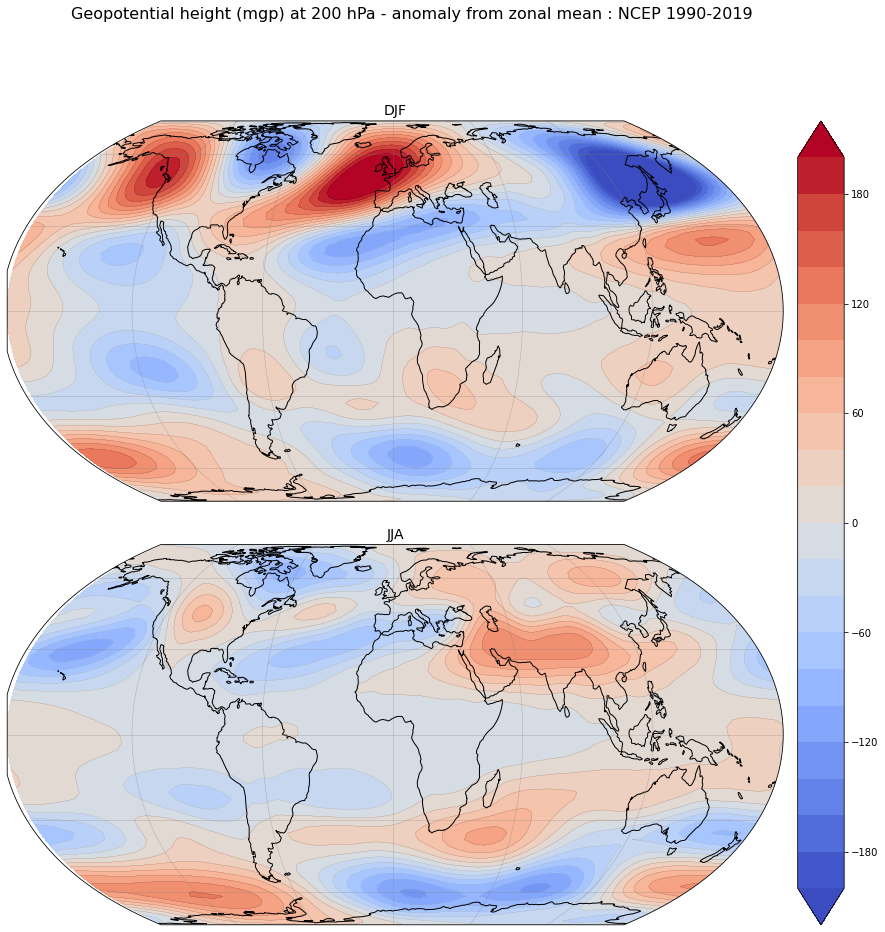

In [57]:
plevz=200
ilev = list(lev).index(plevz)
levels_z_anom = np.arange(-200,220,20)


axes_class = (GeoAxes, dict(map_projection=proj))
fig = plt.figure(figsize=(15,15))
fig.suptitle('Geopotential height (mgp) at '+str(plevz)+' hPa - anomaly from zonal mean : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 1),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
   ax.set_title(seasons[i], fontsize=14)
   plot_background(ax)
   cf = ax.contourf(lon, lat, z_anom[i,ilev,:,:], levels_z_anom, transform=ccrs.PlateCarree(), cmap='coolwarm', extend='both')
   c = ax.contour(lon, lat, z_anom[i,ilev,:,:], levels_z_anom, colors='black', linewidths=0.1, transform=ccrs.PlateCarree())
   axgr.cbar_axes[i].colorbar(cf)

figname='./figs/z'+str(plevz)+'_anomaly_global_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

# Lignes de flux et vent sur le globe

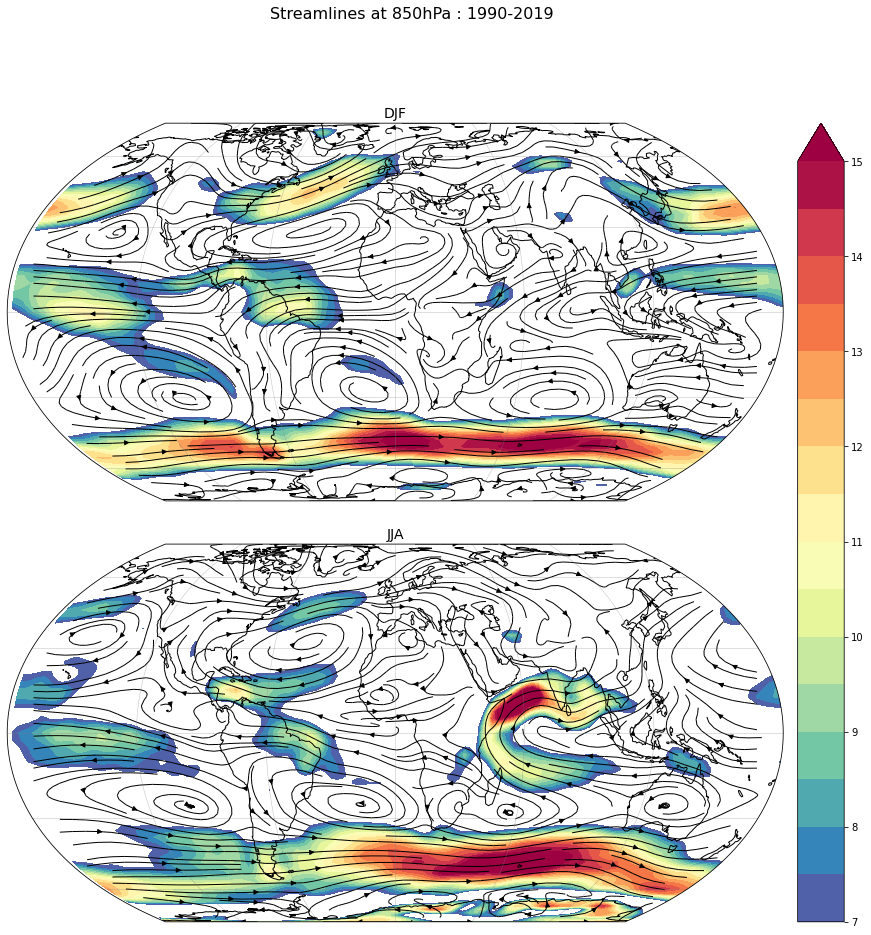

In [58]:
plevu=850
ilev = list(lev).index(plevu)
wind_mod=np.sqrt(u[:,ilev,:,:]*u[:,ilev,:,:]+v[:,ilev,:,:]*v[:,ilev,:,:])
levels_wind = np.arange(7,15.5,0.5)

axes_class = (GeoAxes, dict(map_projection=proj))
fig = plt.figure(figsize=(15,15))
fig.suptitle('Streamlines at '+str(plevu)+ 'hPa : '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 1),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    plot_background(ax)
    ax.set_global()
    c= ax.streamplot(lon, lat, u[i,ilev,:,:], v[i,ilev,:,:], transform=ccrs.PlateCarree(),
                     linewidth=1, density=[2, 2], color='k', cmap='Spectral_r')
    cf = ax.contourf(lon, lat, wind_mod[i,:,:], levels_wind, transform=ccrs.PlateCarree(),
                     cmap='Spectral_r', extend='max')
    axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname='./figs/streamlines_'+str(plevu)+'_global_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

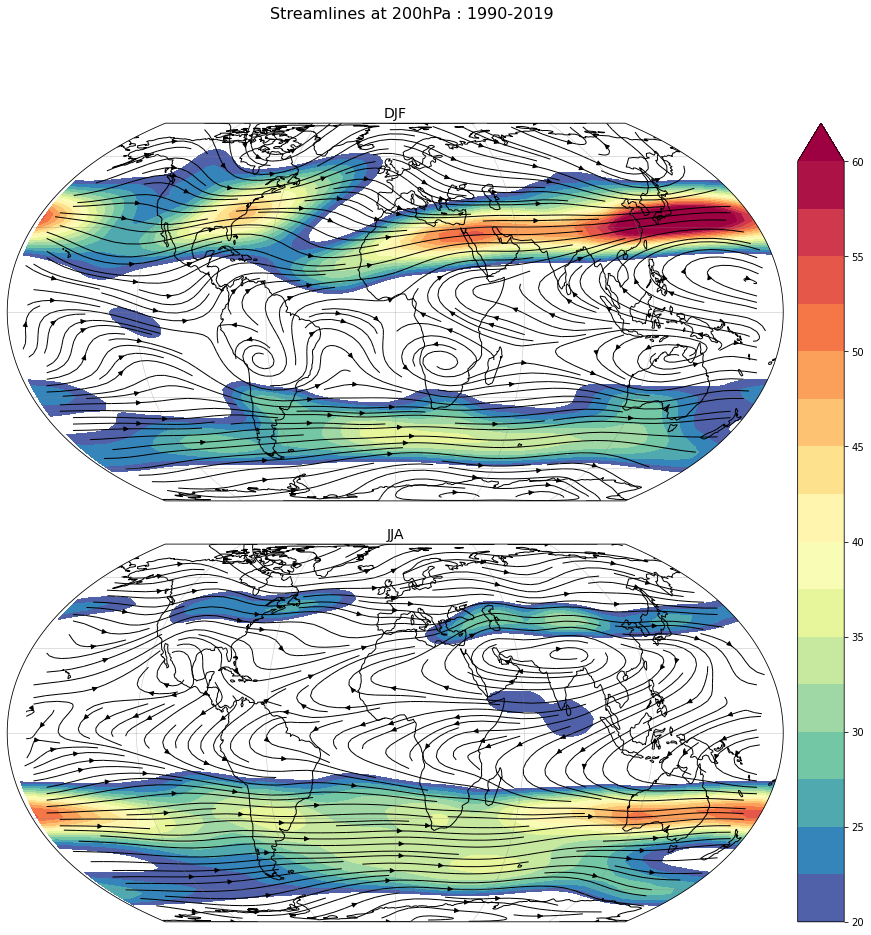

In [59]:
plevu=200
ilev = list(lev).index(plevu)
wind_mod=np.sqrt(u[:,ilev,:,:]*u[:,ilev,:,:]+v[:,ilev,:,:]*v[:,ilev,:,:])
levels_wind = np.arange(20,62.5,2.5)

axes_class = (GeoAxes, dict(map_projection=proj))
fig = plt.figure(figsize=(15,15))
fig.suptitle('Streamlines at '+str(plevu)+ 'hPa : '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 1),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    plot_background(ax)
    ax.set_global()
    c= ax.streamplot(lon, lat, u[i,ilev,:,:], v[i,ilev,:,:], transform=ccrs.PlateCarree(),
                     linewidth=1, density=[2, 2], color='k', cmap='Spectral_r')
    cf = ax.contourf(lon, lat, wind_mod[i,:,:], levels_wind, transform=ccrs.PlateCarree(),
                     cmap='Spectral_r', extend='max')
    axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname='./figs/streamlines_'+str(plevu)+'_global_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

# Cellule de Hadley via la fonction de courant méridienne

In [60]:
# moyenne zonale
vz = v0.mean(axis=3)
vz_month = v0_month.mean(axis=3)

# Calcul de la fonction de courant méridienne
psi = cumtrapz(vz,x=lev*100,axis=1,initial=0) # [m.Pa/s]
psi = 2*np.pi*re/g*psi *np.cos(lat[np.newaxis,np.newaxis,:]*np.pi/180.) #[kg/s]
psi=psi*1e-10 #[10^10 kg/s]
psi_annual=np.mean(psi, axis=0)
psi_month = cumtrapz(vz_month,x=lev*100,axis=1,initial=0) # [m.Pa/s]
psi_month = 2*np.pi*re/g*psi_month *np.cos(lat[np.newaxis,np.newaxis,:]*np.pi/180.) #[kg/s]
psi_month=psi_month*1e-10 #[10^10 kg/s]

print(np.min(psi))
print(np.max(psi))

levels_psi = np.arange(-15,16,1)
levels_psi_an = np.arange(-10,11,1)

levels_psi2 =[-15, -14, -13, -12, -11, -10, -9, -8, -7,
 -6, -5, -4, -3, -2, -1, 1, 2, 3, 4,
  5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

-20.156212
17.58562


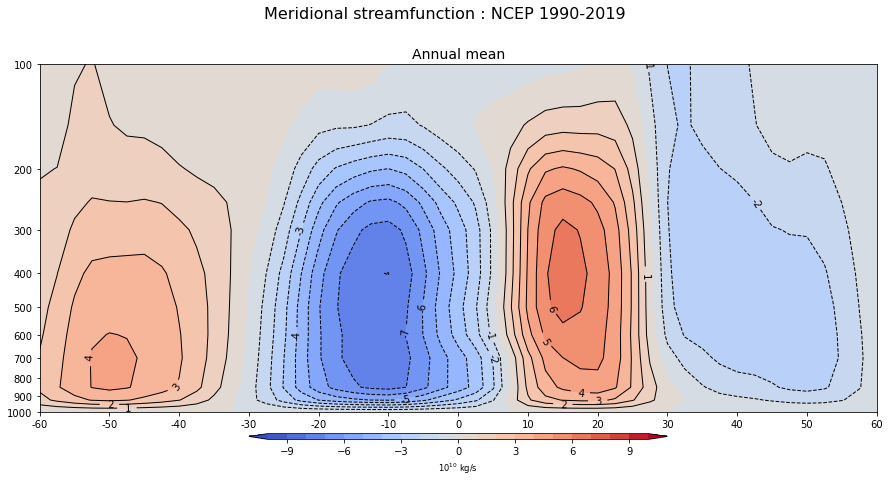

In [61]:
fig = plt.figure(figsize=(15., 8.))
ax = fig.add_subplot(1, 1, 1)
fig.suptitle('Meridional streamfunction : NCEP '+year1+'-'+year2, fontsize=16)

ax.set_title('Annual mean', fontsize=14)
plot_zonal_mean(ax)
ax.set_xlim(-60, 60)
cf = ax.contourf(lat, lev, psi_annual[:,:], levels_psi_an, cmap='coolwarm', extend='both')
c = ax.contour(lat, lev, psi_annual[:,:], levels_psi2, colors='black', linewidths=1)
plt.clabel(c, levels_psi2, fmt='%2.1i')

cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=0.5, pad=0.05)
cb.set_label('10$^{10}$ kg/s', size='small')

figname='./figs/psi_zmean_annual_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

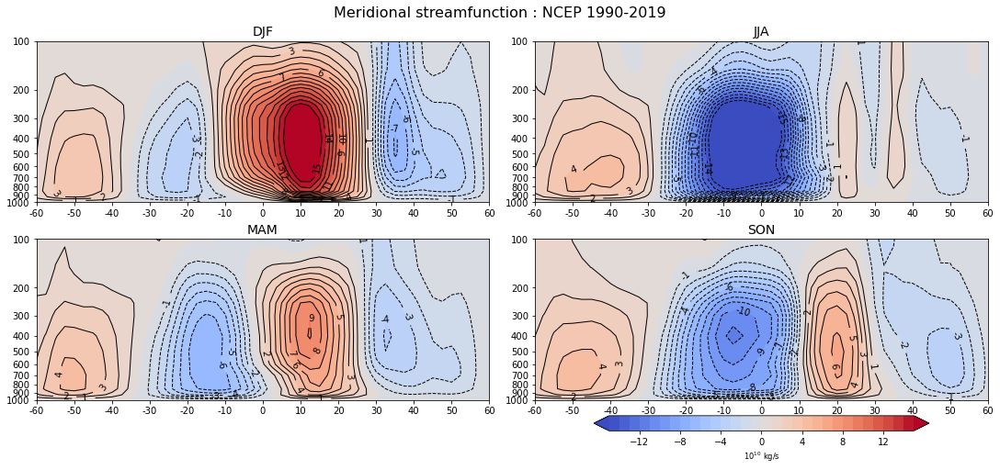

In [62]:
fig, axarr = plt.subplots(nrows=2, ncols=2, figsize=(15, 7), constrained_layout=True)
axlist = axarr.flatten()
fig.suptitle('Meridional streamfunction : NCEP '+year1+'-'+year2, fontsize=16)

for i, ax in enumerate(axlist):
	
 ax.set_title(seasons[i], fontsize=14)
 plot_zonal_mean(ax)
 ax.set_xlim(-60, 60)
 cf = ax.contourf(lat, lev, psi[i,:,:], levels_psi, cmap='coolwarm', extend='both')
 c = ax.contour(lat, lev, psi[i,:,:], levels_psi2, colors='black', linewidths=1)
 plt.clabel(c, levels_psi2, fmt='%2.1i')

cb = fig.colorbar(cf, orientation='horizontal', shrink=0.74, pad=0)
cb.set_label('10$^{10}$ kg/s', size='small')

figname='./figs/psi_zmean_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

In [63]:
for i in range(12): 
    #print(months[i])
    fig = plt.figure(figsize=(15., 8.))
    fig.suptitle('Meridional streamfunction : NCEP '+year1+'-'+year2, fontsize=16)
    ax = fig.add_subplot(1, 1, 1)
    ax.set_title(months[i], fontsize=14)
    plot_zonal_mean(ax)
    ax.set_xlim(-60, 60)
    
    cf = ax.contourf(lat, lev, psi_month[i,:,:], levels_psi, cmap='coolwarm', extend='both')
    c = ax.contour(lat, lev, psi_month[i,:,:], levels_psi2, colors='black', linewidths=1)
    plt.clabel(c, levels_psi2, fmt='%2.1i')
    cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=0.5, pad=0.05)
    cb.set_label('10$^{10}$ kg/s', size='small')
    
    if i<10:
        figname='./anim/psi_zmean_monclim_0'+str(i)
    if i>=10:
        figname='./anim/psi_zmean_monclim_'+str(i)    
    fig.savefig(figname+'.png',bbox_inches='tight')
    plt.close()

In [64]:
gif_filepath = './anim/psi_zmean_monclim.gif'
make_animation()
IPdisplay.Image(url=gif_filepath)

# Cartes en projection polaire

In [65]:
# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.

def polar_circle(ax):
    angle = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(angle), np.cos(angle)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    return ax

In [66]:
#--  add cyclic longitude point
lons = fp_mean.coords['lon']
lon_idx = p0.dims.index('lon')
p2, lons2 = add_cyclic_point(p0.values, coord=lons, axis=lon_idx)
print("Original shape -", p0.shape)
print("New shape -", p2.shape)

levels_p = np.arange(970,1042,2)

Original shape - (4, 73, 144)
New shape - (4, 73, 145)


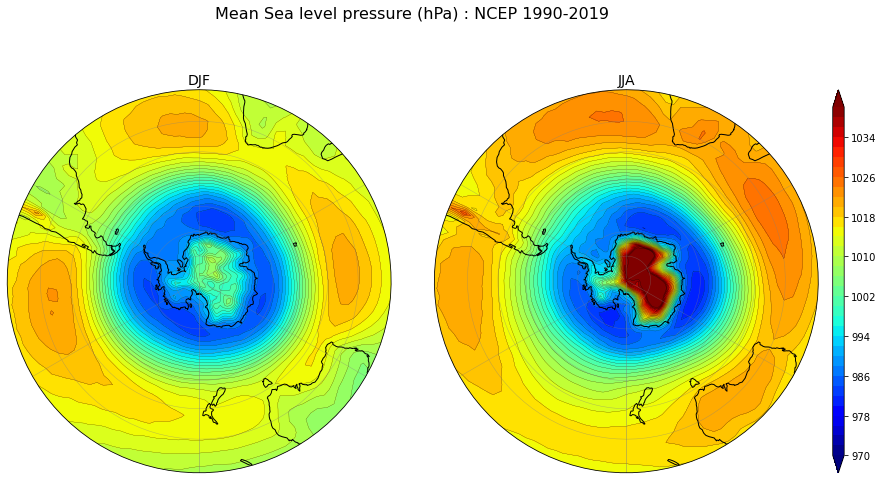

In [67]:
projection=ccrs.SouthPolarStereo()
bounds_SP = [(-180., 180., -20., -90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Mean Sea level pressure (hPa) : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_SP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(seasons[i], fontsize=14)
    c1 = ax.contourf(lons2, lat, p2[i,:,:], levels_p,transform=ccrs.PlateCarree(), cmap='jet', extend='both')
    c2 = ax.contour(lons2, lat, p2[i,:,:], levels_p, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(c1)

figname='./figs/slp_southpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')
   
plt.show()

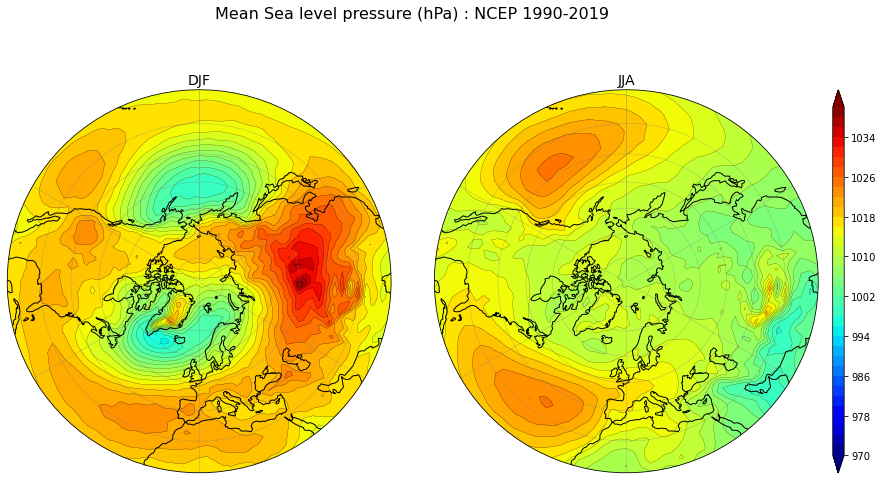

In [68]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 20., 90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Mean Sea level pressure (hPa) : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(seasons[i], fontsize=14)
    c1 = ax.contourf(lons2, lat, p2[i,:,:], levels_p,transform=ccrs.PlateCarree(), cmap='jet', extend='both')
    c2 = ax.contour(lons2, lat, p2[i,:,:], levels_p, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(c1)

figname='./figs/slp_northpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')
   
plt.show()

In [69]:
#--  add cyclic longitude point
lons = fz_mean.coords['lon']
lon_idx = z0.dims.index('lon')
z2, lons2 = add_cyclic_point(z0.values, coord=lons, axis=lon_idx)
u2, lons2 = add_cyclic_point(u0.values, coord=lons, axis=lon_idx)
v2, lons2 = add_cyclic_point(v0.values, coord=lons, axis=lon_idx)
print("Original shape -", z0.shape)
print("New shape -", z2.shape)

uvmod=np.sqrt(u2*u2+v2*v2)

plevz=10
ilev = list(lev).index(plevz)

levels_uvmod = np.arange(0, 65,5)
levels_u10 = np.arange(-60, 65,5)

Original shape - (4, 17, 73, 144)
New shape - (4, 17, 73, 145)


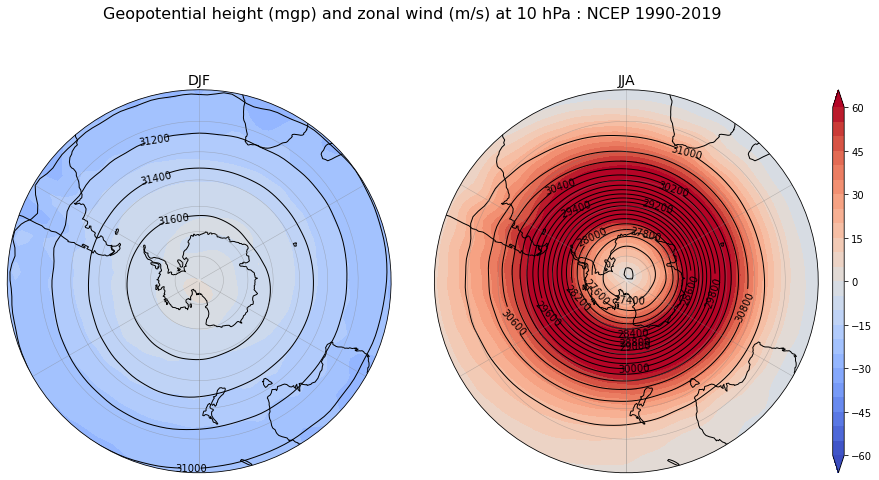

In [70]:
projection=ccrs.SouthPolarStereo()
bounds_SP = [(-180., 180., -20., -90.)]

levels_z = np.arange(25000, 32200,200)

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and zonal wind (m/s) at '+str(plevz)+' hPa : NCEP '+year1+'-'+year2,
             fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_SP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, u2[i,ilev,:,:], levels=levels_u10, transform=ccrs.PlateCarree(),
                     cmap='coolwarm', extend='both')
    axgr.cbar_axes[0].colorbar(cf)
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')

figname='./figs/zu10hPa_southpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

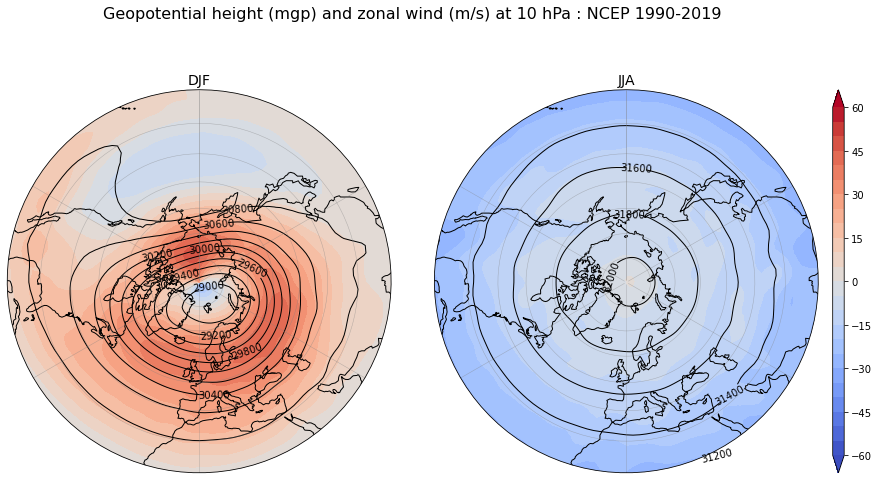

In [71]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 20., 90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and zonal wind (m/s) at '+str(plevz)+' hPa : NCEP '+year1+'-'+year2,
             fontsize=16)
axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, u2[i,ilev,:,:], levels=levels_u10, transform=ccrs.PlateCarree(),
                     cmap='coolwarm', extend='both')
    axgr.cbar_axes[0].colorbar(cf)
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')
    
figname='./figs/zu10hPa_northpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

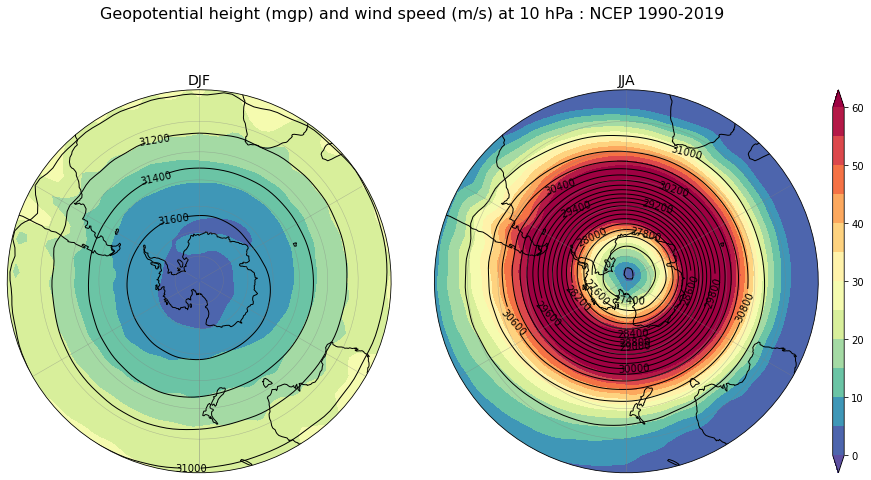

In [72]:
projection=ccrs.SouthPolarStereo()
bounds_SP = [(-180., 180., -20., -90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and wind speed (m/s) at '+str(plevz)+' hPa : NCEP '+year1+'-'+year2,
             fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_SP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, uvmod[i,ilev,:,:], levels=levels_uvmod, transform=ccrs.PlateCarree(),
                     cmap='Spectral_r', extend='both')
    axgr.cbar_axes[0].colorbar(cf)
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')

figname='./figs/zuv10hPa_southpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

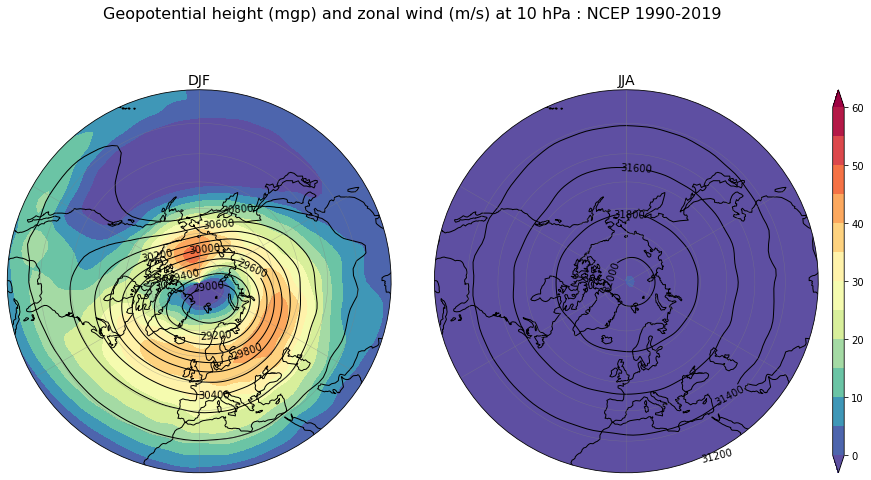

In [73]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 20., 90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and zonal wind (m/s) at '+str(plevz)+' hPa : NCEP '+year1+'-'+year2,
             fontsize=16)
axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, u2[i,ilev,:,:], levels=levels_uvmod, transform=ccrs.PlateCarree(),
                     cmap='Spectral_r', extend='both')
    axgr.cbar_axes[0].colorbar(cf)
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')
    
figname='./figs/zuv10hPa_northpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

In [74]:
#--  add cyclic longitude point
lons = ft_mean.coords['lon']
lon_idx = t0.dims.index('lon')
t2, lons2 = add_cyclic_point(t0.values, coord=lons, axis=lon_idx)
print("Original shape -", t0.shape)
print("New shape -", t2.shape)

plevt=10
ilev = list(lev).index(plevt)

levels_t10 = np.arange(-85, -30,2.5)

Original shape - (4, 17, 73, 144)
New shape - (4, 17, 73, 145)


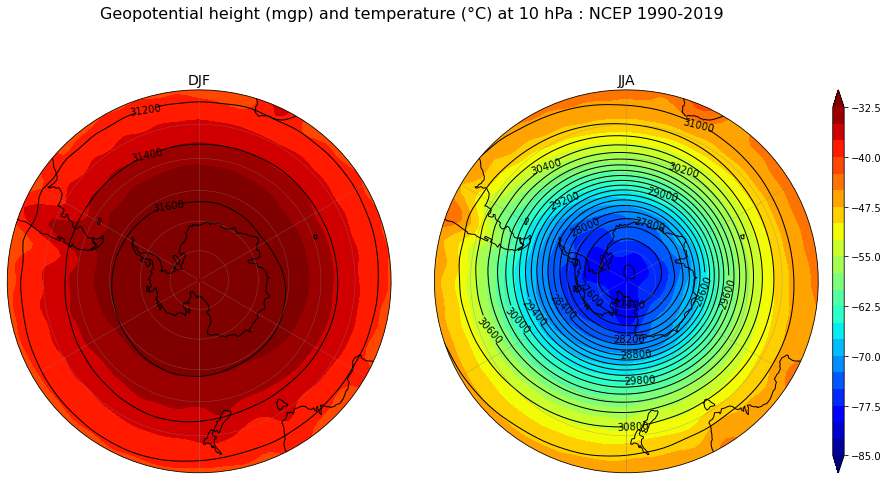

In [75]:
projection=ccrs.SouthPolarStereo()
bounds_SP = [(-180., 180., -30., -90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and temperature (°C) at '+str(plevt)+' hPa : NCEP '+year1+'-'+year2
             , fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_SP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, t2[i,ilev,:,:]-273.15, levels=levels_t10, transform=ccrs.PlateCarree(),
                     cmap='jet', extend='both')
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')
    axgr.cbar_axes[0].colorbar(cf)

figname='./figs/zt10hPa_southpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

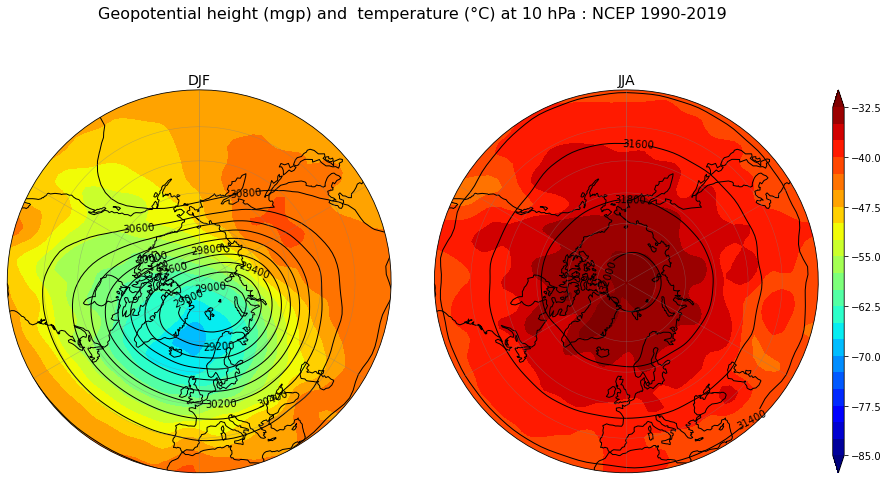

In [76]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 30., 90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Geopotential height (mgp) and  temperature (°C) at '+str(plevt)+' hPa : NCEP '+year1+'-'+year2
             , fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, t2[i,ilev,:,:]-273.15, levels=levels_t10, transform=ccrs.PlateCarree(),
                     cmap='jet', extend='both')
    c = ax.contour(lons2, lat, z2[i,ilev,:,:], levels_z, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    plt.clabel(c, fmt='%4.1i')
    axgr.cbar_axes[0].colorbar(cf)

figname='./figs/zt10hPa_northpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

# Température potentielle et tourbillon potentiel

In [77]:
theta=t*(1.E5/(lev[np.newaxis,:,np.newaxis,np.newaxis]*100))**kap
# Moyenne zonale
thetaz = theta.mean(axis=3)
print(theta.shape)
print(thetaz.shape)

(4, 17, 73, 144)
(4, 17, 73)


In [78]:
# Distances
xlon,ylat=np.meshgrid(lon,lat)
dlony,dlonx=np.gradient(xlon)
dlaty,dlatx=np.gradient(ylat)
dx=re*np.cos(ylat*pi/180)*dlonx*pi/180
dy=re*dlaty*pi/180

# Paramètre de Coriolis
f=2*omega*np.sin(ylat*pi/180)

# Calcul des dérivées spatiales
ddp_theta=np.gradient(theta,lev*100,axis=1)
ddx_theta=np.gradient(theta,axis=3)/dx
ddy_theta=np.gradient(theta,axis=2)/dy
ddp_u=np.gradient(u,lev*100,axis=1)
ddp_v=np.gradient(v,lev*100,axis=1)
ddx_v=np.gradient(v,axis=3)/dx
ddy_u=np.gradient(u,axis=2)/dy

# Calcul du tourbillon potentiel
absvort=ddx_v-(1/np.cos(ylat*pi/180))*ddy_u+f
pv_one=g*absvort*(-ddp_theta)
pv_two=g*(ddp_v*ddx_theta-ddp_u*ddy_theta)
pv=pv_one+pv_two
print(pv.shape)

# Moyenne zonale
pvz = pv.mean(axis=3)
print(pvz.shape)

(4, 17, 73, 144)
(4, 17, 73)


In [79]:
#cartes en moyenne zonale pv, theta
levels_pvz = np.arange(-10,11,0.5)
levels_15pvupos = np.arange(1.5,2,0.5)
levels_15pvuneg = np.arange(-1.5,-2,-0.5)
levels_thetaz = np.arange(200,920,20)
levels_tz = np.arange(180,320,10)

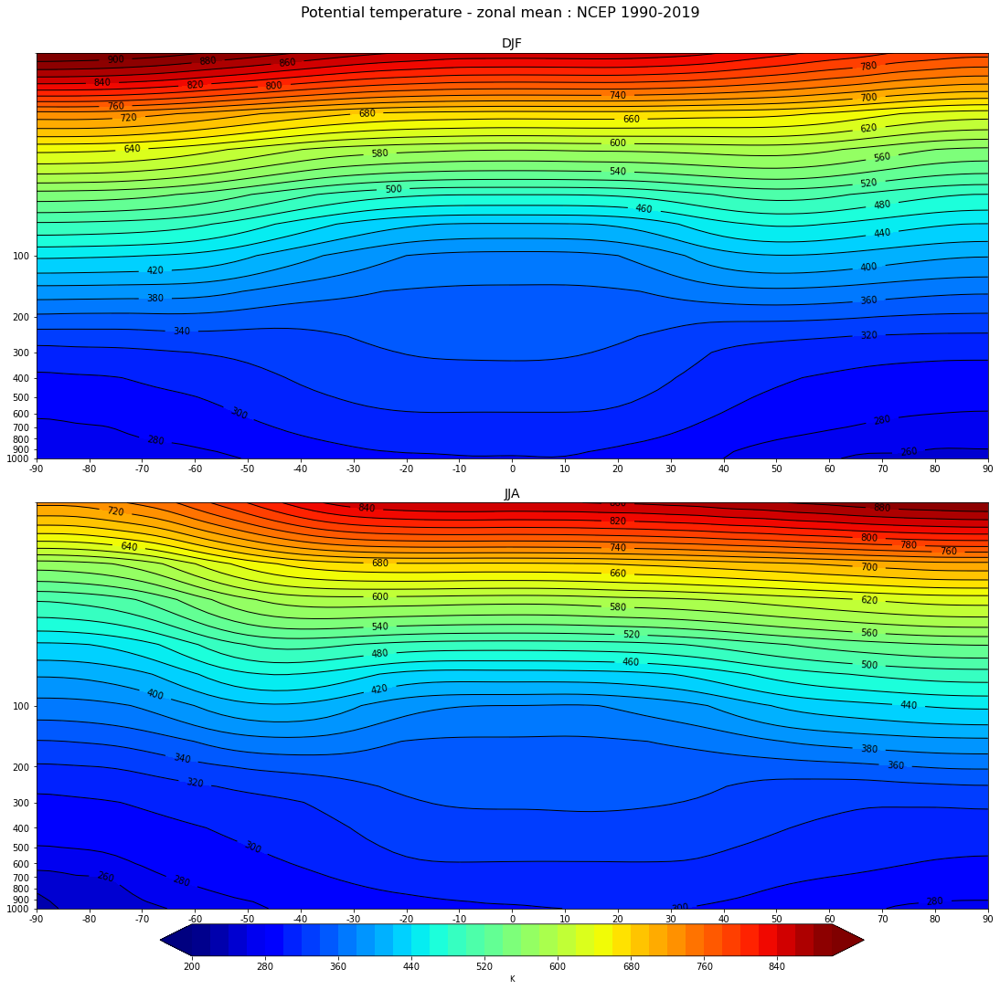

In [80]:
fig, axarr = plt.subplots(nrows=2, ncols=1, figsize=(15, 15), constrained_layout=True)
axlist = axarr.flatten()
fig.suptitle('Potential temperature - zonal mean : NCEP '+year1+'-'+year2, fontsize=16)

for i, ax in enumerate(axlist):
	
 ax.set_title(seasons[i], fontsize=14)
 plot_zonal_mean2(ax)
 cf = ax.contourf(lat, lev, thetaz[i,:,:], levels_thetaz, cmap='jet', extend='both')
 c2 = ax.contour(lat, lev, thetaz[i,:,:], levels_thetaz, colors='black', linewidths=1)
 plt.clabel(c2, levels_thetaz, fmt='%1.2i')

cf = fig.colorbar(cf, ax=axlist[axlist.shape[0]-1], orientation='horizontal', shrink=0.74, pad=0)
cf.set_label('K', size='small')

fig.set_constrained_layout_pads(w_pad=0., h_pad=0.1, hspace=0., wspace=0.)

figname='./figs/theta_zmean_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

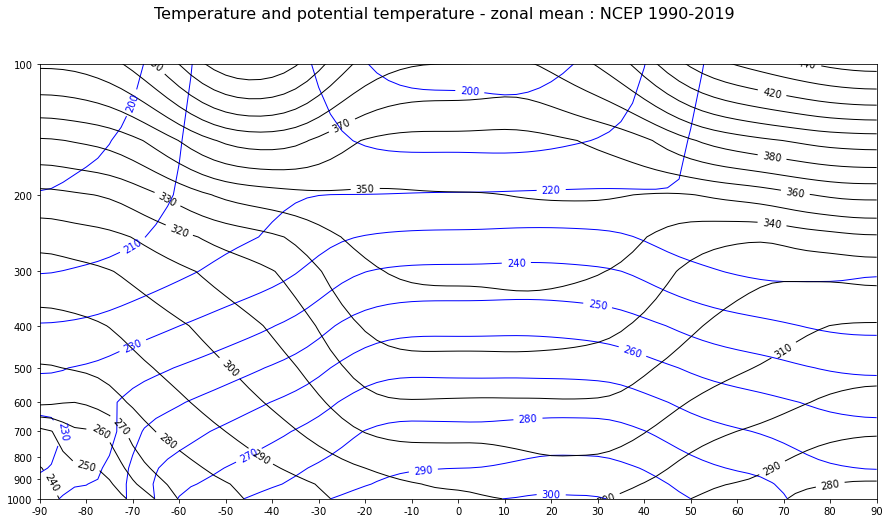

In [81]:
levels_thetaz = np.arange(200,500,10)


tz_mean=tz.mean(axis=1)
thetaz_mean=thetaz.mean(axis=1)

fig = plt.figure(figsize=(15., 8.))
fig.suptitle('Temperature and potential temperature - zonal mean : NCEP '+year1+'-'+year2, fontsize=16)
ax = fig.add_subplot(1, 1, 1)
plot_zonal_mean(ax)
c1 = ax.contour(lat, lev, tz[i,:,:], levels_tz, colors='blue', linewidths=1)
plt.clabel(c1, levels_tz, fmt='%1.2i')
c2 = ax.contour(lat, lev, thetaz[i,:,:], levels_thetaz, colors='black', linewidths=1)
plt.clabel(c2, levels_thetaz, fmt='%1.2i')

figname='./figs/t_theta_zmean_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

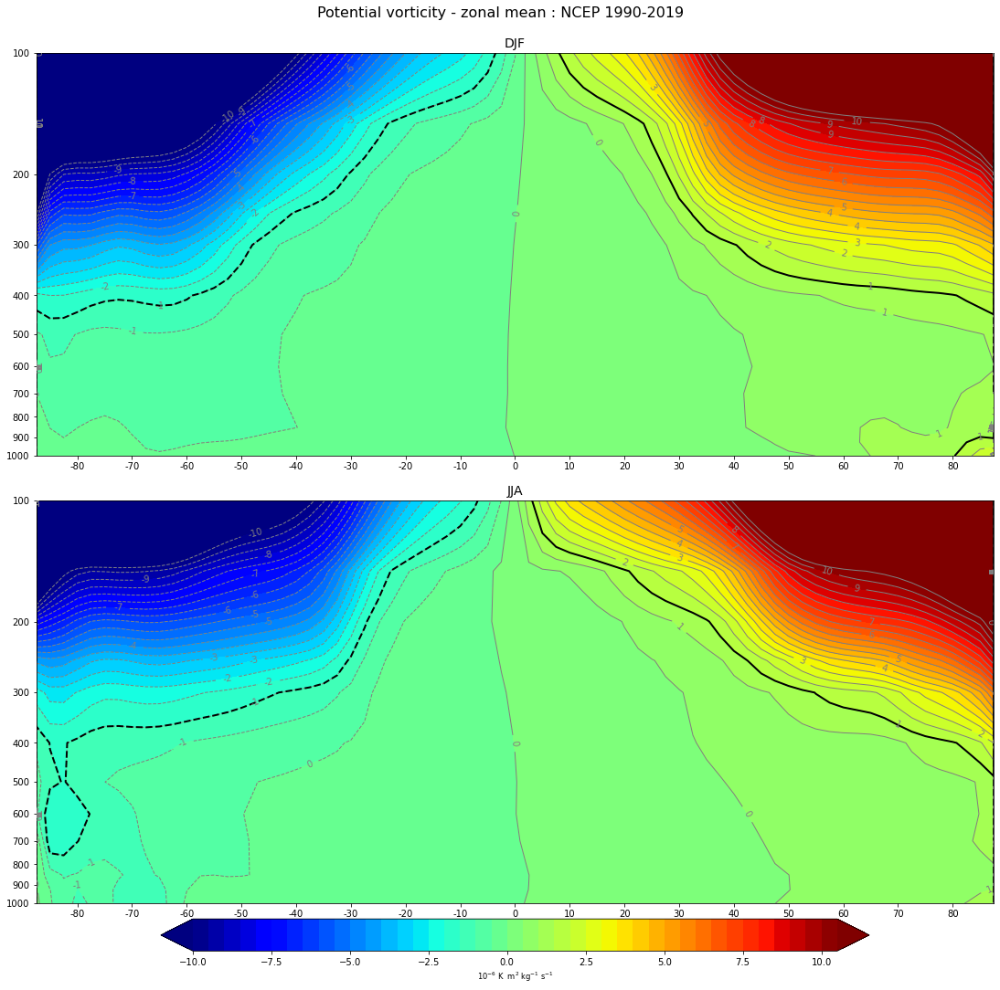

In [82]:
fig, axarr = plt.subplots(nrows=2, ncols=1, figsize=(15, 15), constrained_layout=True)
axlist = axarr.flatten()
fig.suptitle('Potential vorticity - zonal mean : NCEP '+year1+'-'+year2, fontsize=16)

for i, ax in enumerate(axlist):
	
 ax.set_title(seasons[i], fontsize=14)
 plot_zonal_mean(ax)
 ax.set_xlim(-87.5, 87.5)
 cf = ax.contourf(lat, lev, pvz[i,:,:]*1e6, levels_pvz, cmap='jet', extend='both')
 c1 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_pvz, colors='grey', linewidths=1)
 c2 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_15pvupos, colors='black', linewidths=2)
 c3 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_15pvuneg, colors='black', linewidths=2)
 plt.clabel(c1, levels_pvz, fmt='%1.1i')

cf = fig.colorbar(cf, ax=axlist[axlist.shape[0]-1], orientation='horizontal', shrink=0.74, pad=0)
cf.set_label('10$^{-6}$ K  m$^{2}$ kg$^{-1}$ s$^{-1}$', size='small')

fig.set_constrained_layout_pads(w_pad=0., h_pad=0.1, hspace=0., wspace=0.)

figname='./figs/pv_zmean_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

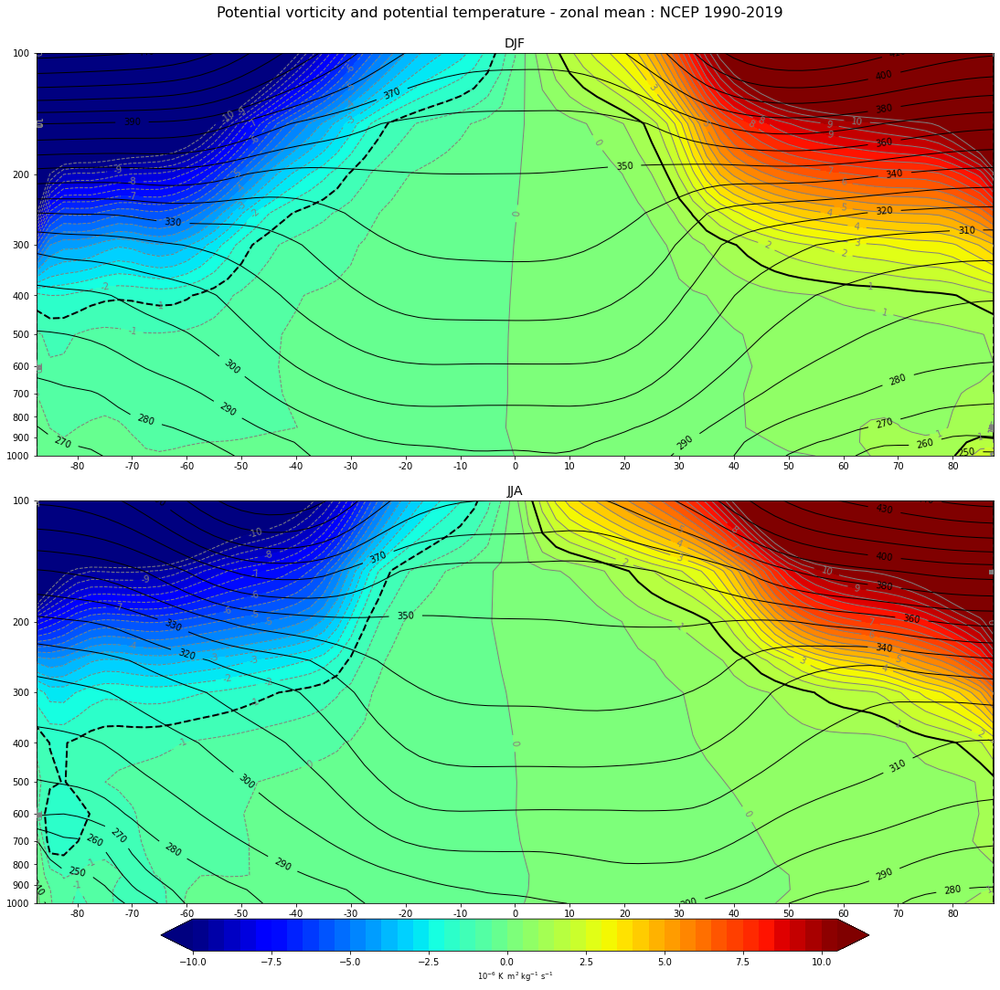

In [83]:
fig, axarr = plt.subplots(nrows=2, ncols=1, figsize=(15, 15), constrained_layout=True)
axlist = axarr.flatten()
fig.suptitle('Potential vorticity and potential temperature - zonal mean : NCEP '+year1+'-'+year2, fontsize=16)

for i, ax in enumerate(axlist):
	
 ax.set_title(seasons[i], fontsize=14)
 plot_zonal_mean(ax)
 ax.set_xlim(-87.5, 87.5)
 cf = ax.contourf(lat, lev, pvz[i,:,:]*1e6, levels_pvz, cmap='jet', extend='both')
 c1 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_pvz, colors='grey', linewidths=1)
 c2 = ax.contour(lat, lev, thetaz[i,:,:], levels_thetaz, colors='black', linewidths=1)
 c3 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_15pvupos, colors='black', linewidths=2)
 c4 = ax.contour(lat, lev, pvz[i,:,:]*1e6, levels_15pvuneg, colors='black', linewidths=2)
 plt.clabel(c2, levels_thetaz, fmt='%1.2i')
 plt.clabel(c1, levels_pvz, fmt='%1.1i')

cf = fig.colorbar(cf, ax=axlist[axlist.shape[0]-1], orientation='horizontal', shrink=0.74, pad=0)
cf.set_label('10$^{-6}$ K  m$^{2}$ kg$^{-1}$ s$^{-1}$', size='small')

fig.set_constrained_layout_pads(w_pad=0., h_pad=0.1, hspace=0., wspace=0.)

figname='./figs/pv_theta_zmean_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

Original shape - (4, 17, 73, 144)
New shape - (4, 17, 73, 145)


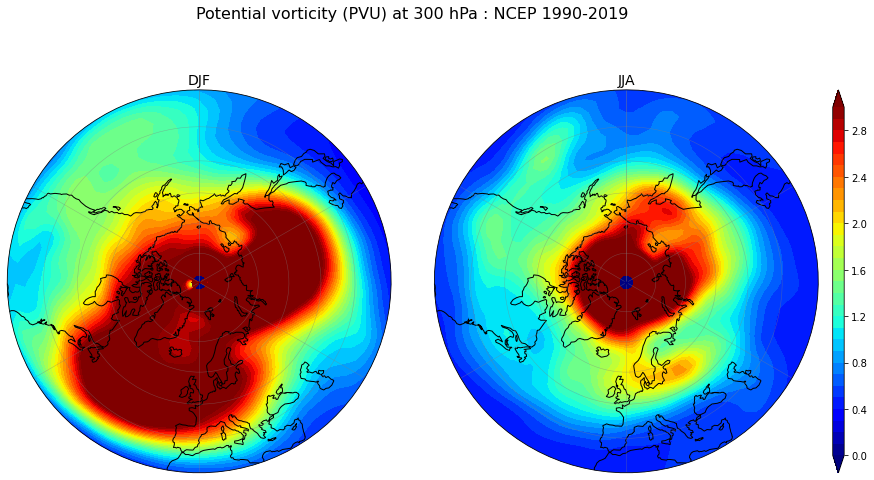

In [84]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 30., 90.)]

levels_pv = np.arange(0, 3.1,0.1)

plevpv=300
ilev = list(lev).index(plevpv)

#--  add cyclic longitude point
lons = fu_mean.coords['lon']
lon_idx = u0.dims.index('lon')
pv2, lons2 = add_cyclic_point(pv, coord=lons, axis=lon_idx)
print("Original shape -", pv.shape)
print("New shape -", pv2.shape)

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Potential vorticity (PVU) at '+str(plevpv)+' hPa : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, pv2[i,ilev,:,:]*1e06, levels=levels_pv, transform=ccrs.PlateCarree(),
                     cmap='jet', extend='both')
    axgr.cbar_axes[0].colorbar(cf)

figname='./figs/pv300hPa_northpole_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

# Décomposition du vent horizontal en fonction de courant et potentiel de vitesse

In [85]:
plev_sfvp=200
ilev = list(lev).index(plev_sfvp)

lons = fu_mean.coords['lon']
lon_idx = u0.dims.index('lon')
u2, lons2 = add_cyclic_point(u0.values, coord=lons, axis=lon_idx)
v2, lons2 = add_cyclic_point(v0.values, coord=lons, axis=lon_idx)

print("Original shape -", u0.shape)
print("New shape -", u2.shape)

uu=u2[:,ilev,:,:]
vv=v2[:,ilev,:,:]

Original shape - (4, 17, 73, 144)
New shape - (4, 17, 73, 145)


In [86]:
from windspharm.standard import VectorWind
from windspharm.tools import prep_data, recover_data, order_latdim
from windspharm.examples import example_data_path

uwnd, uwnd_info = prep_data(uu, 'tyx')
vwnd, vwnd_info = prep_data(vv, 'tyx')

lats, uwnd, vwnd = order_latdim(lat, uwnd, vwnd)

w = VectorWind(uwnd, vwnd)

sf, vp = w.sfvp()
uchi, vchi = w.irrotationalcomponent()
upsi, vpsi = w.nondivergentcomponent()

sf = recover_data(sf, uwnd_info)
vp = recover_data(vp, uwnd_info)

uchi = recover_data(uchi, uwnd_info)
upsi = recover_data(upsi, uwnd_info)
vchi = recover_data(vchi, uwnd_info)
vpsi = recover_data(vpsi, uwnd_info)

print(sf.shape)
print(vp.shape)

ModuleNotFoundError: No module named 'windspharm'

In [ ]:
sf_zmean = sf.mean(axis=2)
print(sf_zmean.shape)
sf_zmean2=sf_zmean[:,:,np.newaxis]
print(sf_zmean2.shape)
sf_anom=sf-sf_zmean2 # ecart a la moyenne zonale de la fonction de courant
print(sf_anom.shape)

In [ ]:
levels_sf = np.arange(-150,160,10)

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree()))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Streamfunction ($10^6$m$^2$s$^{-1}$) at '+str(plev_sfvp)+' hPa : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
   ax.set_xticks(np.linspace(-180, 180, 13), crs=ccrs.PlateCarree())
   ax.set_yticks(np.linspace(-90, 90, 13), crs=ccrs.PlateCarree())
   ax.axes.axis('tight')
   lon_formatter = LongitudeFormatter(zero_direction_label=True)
   lat_formatter = LatitudeFormatter()
   ax.xaxis.set_major_formatter(lon_formatter)
   ax.yaxis.set_major_formatter(lat_formatter)
   ax.coastlines()
   ax.set_title(seasons[i], fontsize=14)
   cf = ax.contourf(lons2, lat, sf[i,:,:] * 1e-06, levels_sf, transform=ccrs.PlateCarree(),
                    cmap='jet', extend='both')
   c = ax.contour(lons2, lat, sf[i,:,:] * 1e-06, levels_sf, colors='black',
                  linewidths=0.5, transform=ccrs.PlateCarree())    
   axgr.cbar_axes[i].colorbar(cf)
    
figname='./figs/sf200_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

In [ ]:
levels_sf_anom = np.arange(-30,35,5)

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree()))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Deviation from zonal mean of the streamfunction ($10^6$m$^2$s$^{-1}$) at '+str(plev_sfvp)+' hPa : NCEP '+year1+'-'+year2
             , fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
   ax.set_xticks(np.linspace(-180, 180, 13), crs=ccrs.PlateCarree())
   ax.set_yticks(np.linspace(-90, 90, 13), crs=ccrs.PlateCarree())
   ax.axes.axis('tight')
   lon_formatter = LongitudeFormatter(zero_direction_label=True)
   lat_formatter = LatitudeFormatter()
   ax.xaxis.set_major_formatter(lon_formatter)
   ax.yaxis.set_major_formatter(lat_formatter)
   ax.coastlines()
   ax.set_title(seasons[i], fontsize=14)
   cf = ax.contourf(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, transform=ccrs.PlateCarree(),
                    cmap='coolwarm', extend='both')
   c = ax.contour(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, colors='black',
                  linewidths=0.5, transform=ccrs.PlateCarree())    
   axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname='./figs/sf200_anom_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

In [ ]:
projection=ccrs.NorthPolarStereo()
bounds_NP = [(-180., 180., 0., 90.)]

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Deviation from zonal mean of the streamfunction ($10^6$m$^2$s$^{-1}$) at '+str(plev_sfvp)+' hPa : NCEP '+year1+'-'+year2
             , fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, transform=ccrs.PlateCarree(),
                     cmap='coolwarm', extend='both')
    c = ax.contour(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, colors='black',
                   linewidths=0.5, transform=ccrs.PlateCarree())  
    axgr.cbar_axes[0].colorbar(cf)

figname='./figs/sf200_anom_NH_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

In [ ]:
projection=ccrs.SouthPolarStereo()
bounds_NP = [(-180., 180., -90., 0.)] 

axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Deviation from zonal mean of the streamfunction ($10^6$m$^2$s$^{-1}$) at '+str(plev_sfvp)+' hPa : NCEP '+year1+'-'+year2
             , fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(1, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.set_title(seasons[i], fontsize=14)
    ax.coastlines()
    polar_circle(ax)
    ax.set_extent(*bounds_NP, crs=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, transform=ccrs.PlateCarree(),
                     cmap='coolwarm', extend='both')
    c = ax.contour(lons2, lat, sf_anom[i,:,:] * 1e-06, levels=levels_sf_anom, colors='black',
                   linewidths=0.5, transform=ccrs.PlateCarree())  
    axgr.cbar_axes[0].colorbar(cf)

figname='./figs/sf200_anom_SH_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

plt.show()

In [ ]:
levels_vp = np.arange(-12,13,1)

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree()))
fig = plt.figure(figsize=(15,8))
fig.suptitle('Potential velocity ($10^6$m$^2$s$^{-1}$) at '+str(plev_sfvp)+' hPa : NCEP '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(2, 2),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
   ax.set_xticks(np.linspace(-180, 180, 13), crs=ccrs.PlateCarree())
   ax.set_yticks(np.linspace(-90, 90, 13), crs=ccrs.PlateCarree())
   ax.axes.axis('tight')
   lon_formatter = LongitudeFormatter(zero_direction_label=True)
   lat_formatter = LatitudeFormatter()
   ax.xaxis.set_major_formatter(lon_formatter)
   ax.yaxis.set_major_formatter(lat_formatter)
   ax.coastlines()
   ax.set_title(seasons[i], fontsize=14)
   cf = ax.contourf(lons2, lat, vp[i,:,:] * 1e-06, levels_vp, transform=ccrs.PlateCarree(),
                    cmap='BrBG_r', extend='both')
   c = ax.contour(lons2, lat, vp[i,:,:] * 1e-06, levels_vp, colors='black',
                  linewidths=0.5, transform=ccrs.PlateCarree())    
   axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname='./figs/vp200_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

# OLR (Outgoing Longwave Radiation) en zone tropicale

Original shape - (4, 25, 144)
New shape - (4, 25, 145)


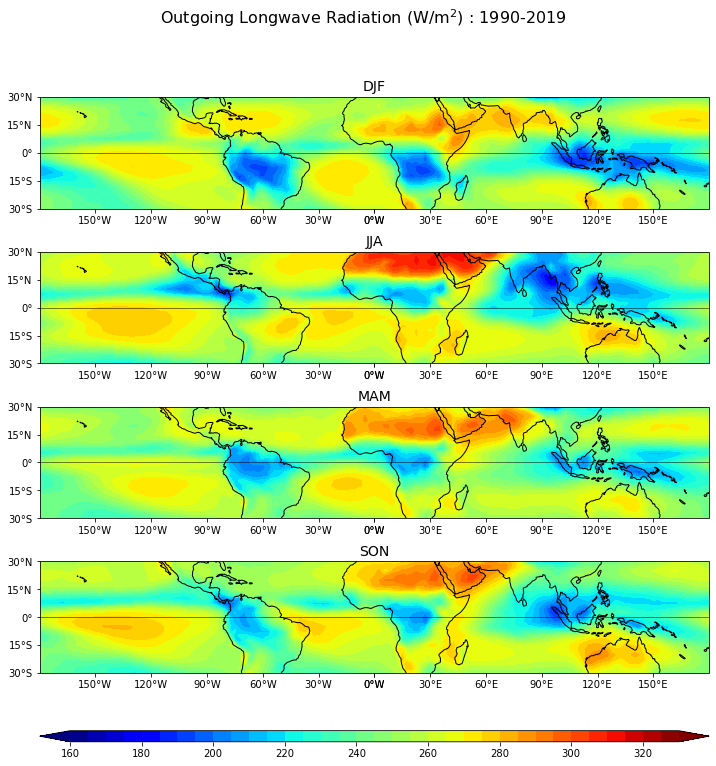

In [87]:
latS=-30
latN=30

folr    = xr.open_dataset('./data/olr.mon.mean.nc').sel(time=slice(year1,year2)).sel(lat=slice(latN,latS))
folr_mean = folr.groupby('time.season').mean('time')
lats = folr.lat.values
olr = folr_mean['olr']

#--  add cyclic longitude point
lons = folr_mean.coords['lon']
lon_idx = olr.dims.index('lon')
olr2, lons2 = add_cyclic_point(olr.values, coord=lons, axis=lon_idx)
print("Original shape -", olr.shape)
print("New shape -", olr2.shape)

levels = np.arange(160,335,5)

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree(central_longitude=0)))
fig = plt.figure(figsize=(12, 12))
fig.suptitle('Outgoing Longwave Radiation (W/m$^2$) : '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(4, 1),
       axes_pad=0.6,
       cbar_location='bottom',
       cbar_mode='single',
       cbar_pad=0.2,
       cbar_size='10%',
       label_mode='')  # note the empty label_mode

bounds = [(0, 357.5, latS, latN)]

for i, ax in enumerate(axgr):
    ax.set_xticks(np.linspace(0, 360, 13), crs=ccrs.PlateCarree())
    ax.set_yticks(np.linspace(latS, latN, 5), crs=ccrs.PlateCarree())
    ax.axes.axis('tight')
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.coastlines()
    ax.plot([0, 180], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.plot([-180, 0], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.set_extent(*bounds, crs=ccrs.PlateCarree())
    ax.set_title(seasons[i], fontsize=14)
    cf = ax.contourf(lons2, lats, olr2[i,:,:], levels, transform=ccrs.PlateCarree(), cmap='jet', extend='both')
    axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname='./figs/OLR_global_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

# Lignes de flux en zone tropicale

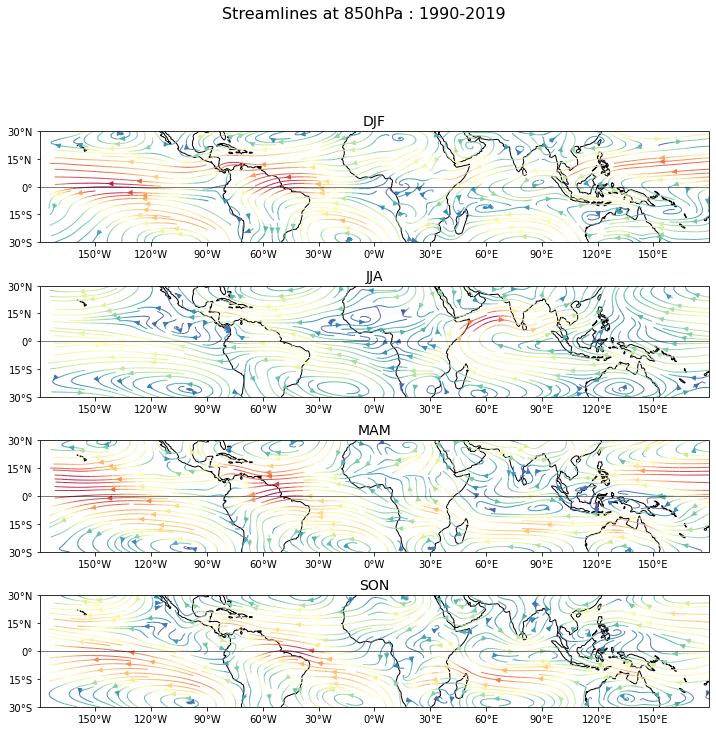

In [88]:
plevu=850
ilev = list(lev).index(plevu)
wind_mod=np.sqrt(u[:,ilev,:,:]*u[:,ilev,:,:]+v[:,ilev,:,:]*v[:,ilev,:,:])

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree(central_longitude=0)))
fig = plt.figure(figsize=(12, 12))
fig.suptitle('Streamlines at '+str(plevu)+ 'hPa : '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(4, 1),
       axes_pad=0.6,
       cbar_location='bottom',
       cbar_mode='none',
       cbar_pad=0.2,
       cbar_size='10%',
       label_mode='')  # note the empty label_mode

bounds = [(0, 357.5, latS, latN)]

for i, ax in enumerate(axgr):
    ax.set_xticks(np.linspace(-180, 180, 13), crs=ccrs.PlateCarree())
    ax.set_yticks(np.linspace(latS, latN, 5), crs=ccrs.PlateCarree())
    ax.axes.axis('tight')
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.coastlines()
    ax.plot([0, 180], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.plot([-180, 0], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.set_extent(*bounds, crs=ccrs.PlateCarree())
    ax.set_title(seasons[i], fontsize=14)
    c= ax.streamplot(lon, lat, u[i,ilev,:,:], v[i,ilev,:,:], transform=ccrs.PlateCarree(),
                     linewidth=1, density=[3, 1], color=wind_mod[i,:,:], cmap='Spectral_r')

plt.show()

figname='./figs/streamlines_'+str(plevu)+'_tropics_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

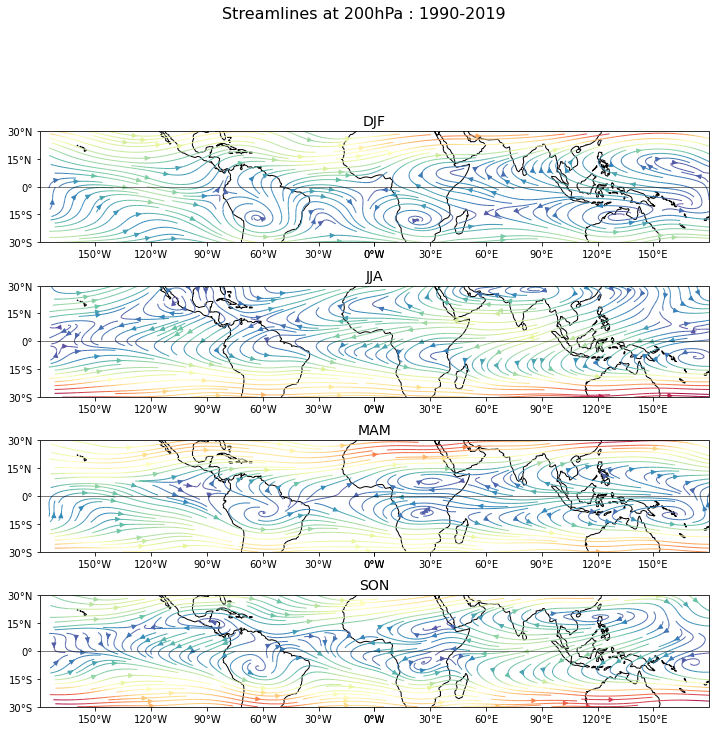

In [89]:
plevu=200
ilev = list(lev).index(plevu)
wind_mod=np.sqrt(u[:,ilev,:,:]*u[:,ilev,:,:]+v[:,ilev,:,:]*v[:,ilev,:,:])

axes_class = (GeoAxes, dict(map_projection=ccrs.PlateCarree(central_longitude=0)))
fig = plt.figure(figsize=(12, 12))
fig.suptitle('Streamlines at '+str(plevu)+ 'hPa : '+year1+'-'+year2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(4, 1),
       axes_pad=0.6,
       cbar_location='bottom',
       cbar_mode='none',
       cbar_pad=0.2,
       cbar_size='10%',
       label_mode='')  # note the empty label_mode

bounds = [(0, 357.5, latS, latN)]

for i, ax in enumerate(axgr):
    ax.set_xticks(np.linspace(0, 360, 13), crs=ccrs.PlateCarree())
    ax.set_yticks(np.linspace(latS, latN, 5), crs=ccrs.PlateCarree())
    ax.axes.axis('tight')
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.coastlines()
    ax.plot([0, 180], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.plot([-180, 0], [0, 0] , color='k', linewidth=0.5, transform=ccrs.PlateCarree())
    ax.set_extent(*bounds, crs=ccrs.PlateCarree())
    ax.set_title(seasons[i], fontsize=14)
    c= ax.streamplot(lon, lat, u[i,ilev,:,:], v[i,ilev,:,:], transform=ccrs.PlateCarree(),
                     linewidth=1, density=[3, 1], color=wind_mod[i,:,:], cmap='Spectral_r')

plt.show()

figname='./figs/streamlines_'+str(plevu)+'_tropics_climatology'
fig.savefig(figname+'.png',bbox_inches='tight')

# Cyclones tropicaux

In [90]:
y1=1980
y2=2015

df    = xr.open_dataset("./data/IBTrACS.ALL.v04r00.nc")
#df    = xr.open_dataset("./data/IBTrACS.since1980.v04r00.nc")
#print(df)

# Manage dates

time  = df.time.values
time_str=[x for x in range(len(time))]
year_str=[x for x in range(len(time))]
year_int=[x for x in range(len(time))]

for i in range(len(time)):
	time_str[i] = str(time[i])
	year_str[i] = time_str[i][2:6]
	year_int[i] = int(year_str[i])
#print(year_int)
year_index=[index for index,value in enumerate(year_int) if value >= y1 and value<=y2]

lats  = df.lat.values[year_index]
lons  = df.lon.values[year_index]

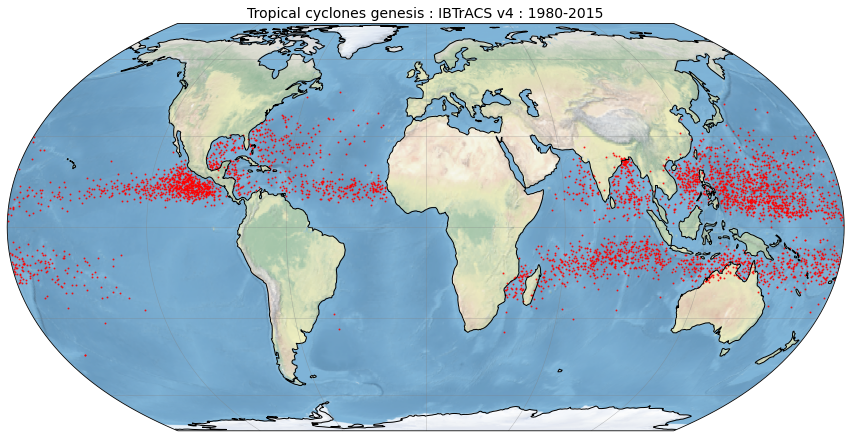

In [91]:
fig = plt.figure(figsize=(15., 10.))
ax = fig.add_subplot(1, 1, 1, projection=proj)
ax.set_title('Tropical cyclones genesis : IBTrACS v4 : '+str(y1)+'-'+str(y2), fontsize=14)
plot_background(ax)
ax.set_global()
ax.stock_img()
ax.scatter(lons[:,0], lats[:,0], color='r', s=.9, alpha=.8, transform=ccrs.PlateCarree())
plt.show()
figname='./figs/ibtracs_genesis_'+str(y1)+'-'+str(y2)
fig.savefig(figname+'.png',bbox_inches='tight')

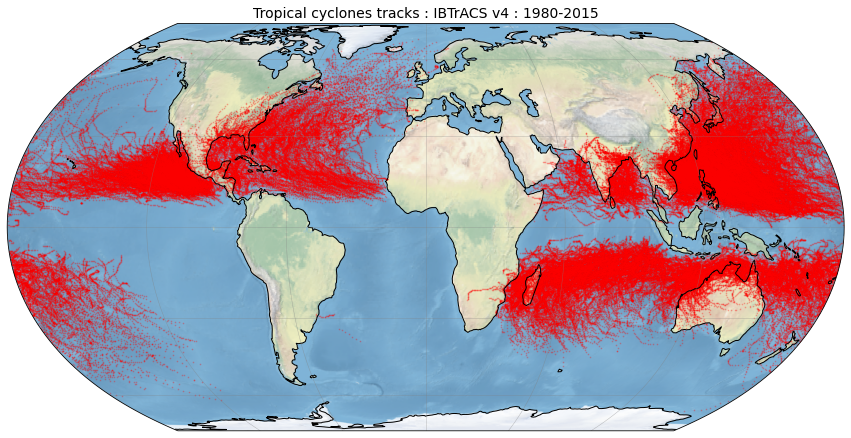

In [92]:
fig = plt.figure(figsize=(15., 10.))
ax = fig.add_subplot(1, 1, 1, projection=proj)
ax.set_title('Tropical cyclones tracks : IBTrACS v4 : '+str(y1)+'-'+str(y2), fontsize=14)
plot_background(ax)
ax.set_global()
ax.stock_img()
ax.scatter(lons[:,:], lats[:,:], color='r', s=.5, alpha=.25, transform=ccrs.PlateCarree())
plt.show()
figname='./figs/ibtracs_tracks1_'+str(y1)+'-'+str(2)
fig.savefig(figname+'.png',bbox_inches='tight')

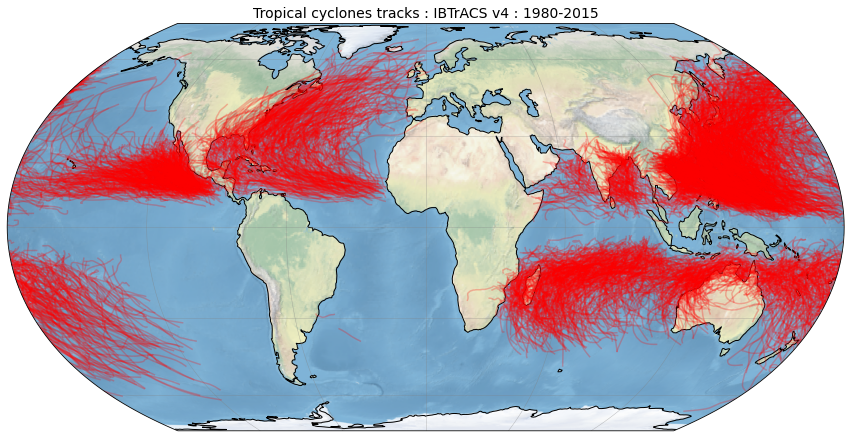

In [93]:
fig = plt.figure(figsize=(15., 10.))
ax = fig.add_subplot(1, 1, 1, projection=proj)
ax.set_title('Tropical cyclones tracks : IBTrACS v4 : '+str(y1)+'-'+str(y2), fontsize=14)
plot_background(ax)
ax.set_global()
ax.stock_img()
# loop for each system and overlay
for i in range(len(lats)):
 ax.plot(lons[i,:], lats[i,:], color='r', alpha=.25, transform=ccrs.PlateCarree())
plt.show()
figname='./figs/ibtracs_tracks2_'+str(y1)+'-'+str(y2)
fig.savefig(figname+'.png',bbox_inches='tight')